# Run FlowSOM for pixel and cell clustering

This notebook provides an implementation of unsupervised pixel and cell level clustering approach described in Liu, C.C., Greenwald, N.F., Kong, A., et al. (2023). *Robust phenotyping of highly multiplexed tissue imaging data using pixel-level clustering*. Nature Communications, 14, 4618. https://doi.org/10.1038/s41467-023-40068-5.

This implementation follows the methodology of the original [ark-analysis repository](https://github.com/angelolab/ark-analysis) but has been reengineered for compatibility with [SpatialData](https://github.com/scverse/spatialdata) and leverages [Dask](https://github.com/dask/dask) for efficient scaling to gigapixel-scale images.

You can run this notebook, without installing [squidpy](https://github.com/scverse/squidpy), but to run the cell that calls `hp.tb.spatial_pixel_neighbors`, you'll need to install it.

In [1]:
import harpy as hp
from harpy.datasets import pixie_example
from harpy.utils._keys import ClusteringKey

# supress warnings
import warnings

warnings.filterwarnings(
    "ignore", message="The table is annotating", category=UserWarning
)

## 1. Load example dataset

In [2]:
import os
import tempfile

from spatialdata import read_zarr

sdata = pixie_example()

# back the spatialdata object to a zarr store:

OUTPUT_DIR = tempfile.gettempdir()

zarr_path = os.path.join(OUTPUT_DIR, "sdata_pixie.zarr")

sdata.write(zarr_path, overwrite=True)
sdata = read_zarr(sdata.path)

no parent found for <ome_zarr.reader.Label object at 0x1224d2c90>: None
no parent found for <ome_zarr.reader.Label object at 0x1224d3680>: None
no parent found for <ome_zarr.reader.Label object at 0x1224e1bb0>: None
no parent found for <ome_zarr.reader.Label object at 0x1224d3c80>: None
no parent found for <ome_zarr.reader.Label object at 0x1224e3d40>: None
no parent found for <ome_zarr.reader.Label object at 0x1224e27e0>: None
no parent found for <ome_zarr.reader.Label object at 0x1224f6060>: None
no parent found for <ome_zarr.reader.Label object at 0x1224e1cd0>: None
no parent found for <ome_zarr.reader.Label object at 0x1224b8410>: None
no parent found for <ome_zarr.reader.Label object at 0x1224b9010>: None
no parent found for <ome_zarr.reader.Label object at 0x12248adb0>: None
no parent found for <ome_zarr.reader.Label object at 0x1224d0230>: None
no parent found for <ome_zarr.reader.Label object at 0x1223dea50>: None
no parent found for <ome_zarr.reader.Label object at 0x12246d4f0

In [3]:
channels = [
    "CD3",
    "CD4",
    "CD8",
    "CD14",
    "CD20",
    "CD31",
    "CD45",
    "CD68",
    "CD163",
    "CK17",
    "Collagen1",
    "Fibronectin",
    "ECAD",
    "HLADR",
    "SMA",
    "Vim",
]

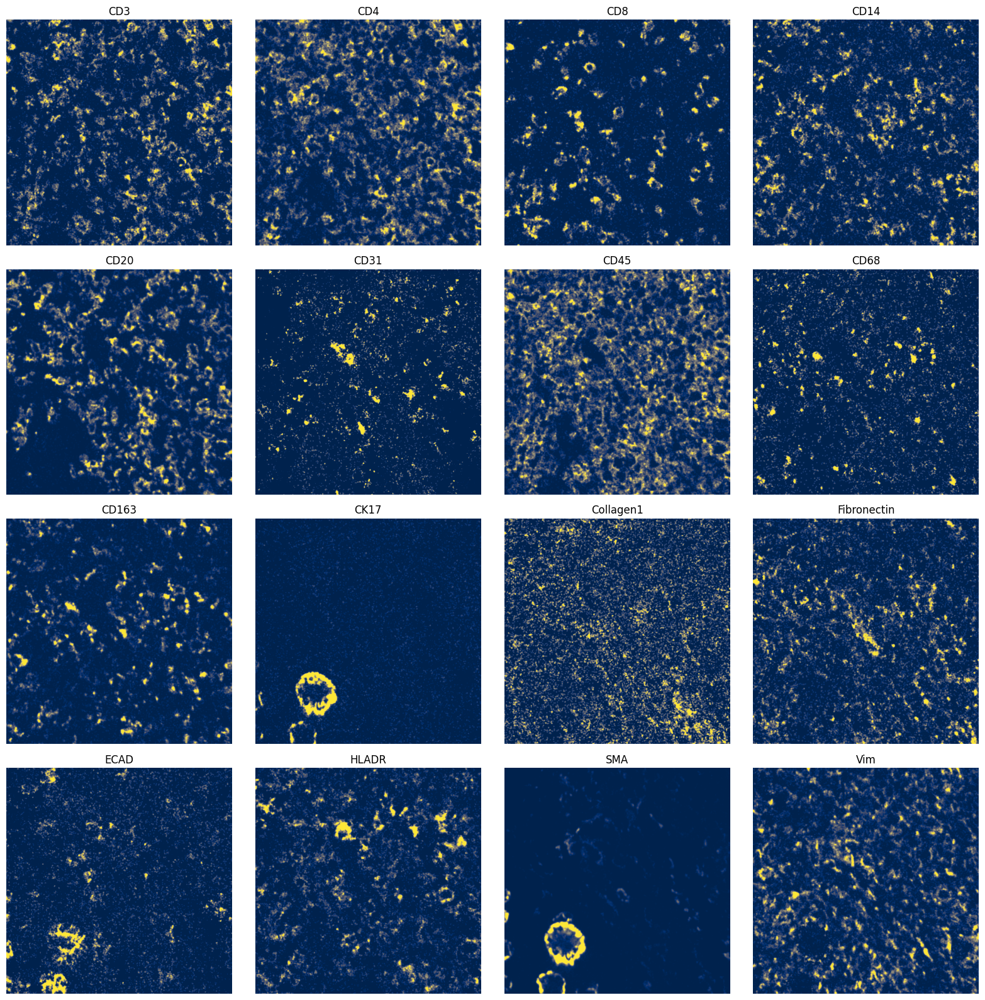

In [4]:
import numpy as np
import dask.array as da
from matplotlib.colors import Normalize

import matplotlib.pyplot as plt

fig, axes = plt.subplots(4, 4, figsize=(16, 16))
_image_name = "raw_image_fov0"
to_coordinate_system = "fov0"

for _ax, _channel in zip(axes.flatten(), channels, strict=True):
    # normalization parameters for visualization (underlying image not changed)
    se = hp.im.get_dataarray(sdata, element_name=_image_name)
    _channel_idx = np.where(sdata[_image_name].c.data == _channel)[0].item()
    vmax = da.percentile(se.data[_channel_idx].flatten(), q=99).compute()
    norm = Normalize(vmax=vmax, clip=False)

    render_images_kwargs = {"cmap": "cividis", "norm": norm}
    show_kwargs = {"title": _channel, "colorbar": False}
    _ax = hp.pl.plot_sdata(
        sdata,
        image_name=_image_name,
        channel=_channel,
        to_coordinate_system=to_coordinate_system,
        render_images_kwargs=render_images_kwargs,
        show_kwargs=show_kwargs,
        ax=_ax,
    )
    # frameless figure
    _ax.axis("off")

plt.tight_layout()
plt.show()

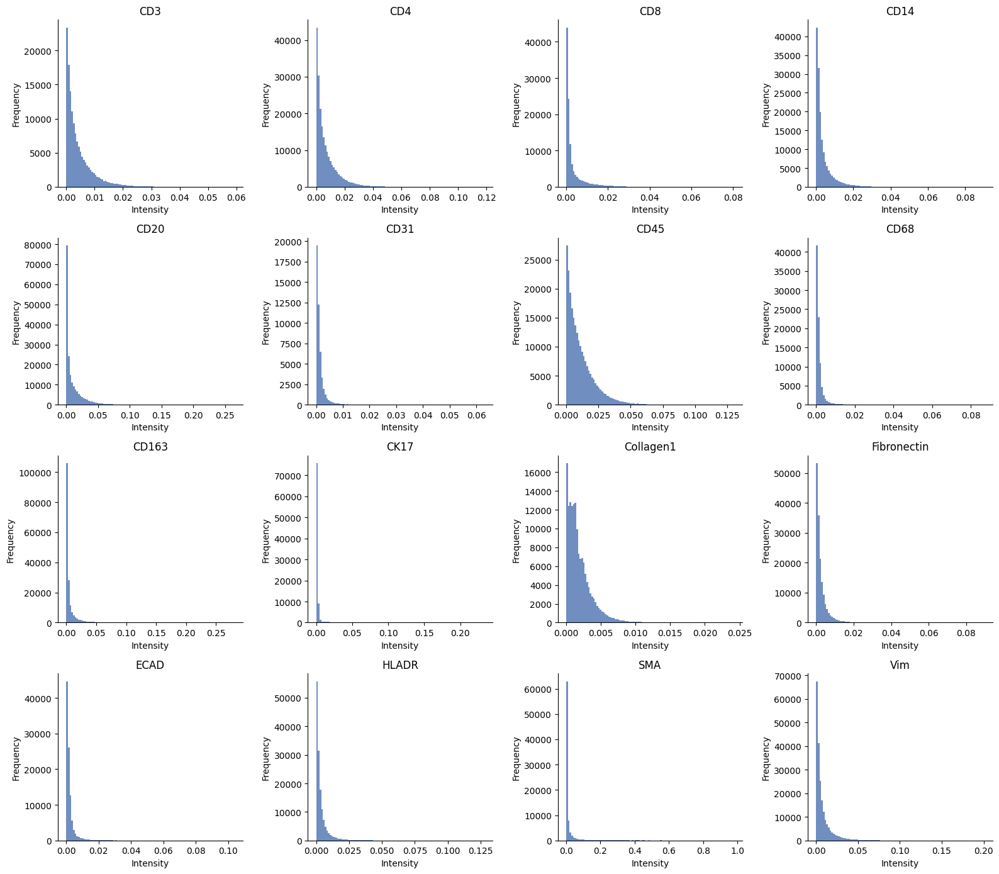

In [5]:
ax = hp.qc.image_histogram(
    sdata,
    image_name="raw_image_fov0",
    channel=channels,
    ncols=4,
    bins=100,
)

## 2. Preprocess

In [6]:
N = 11  # set to 11 to process all samples

image_name = [f"raw_image_fov{i}" for i in range(N)]

sdata = hp.im.pixel_clustering_preprocess(
    sdata,
    image_name=image_name,
    output_image_name=[f"{_image_name}_processed" for _image_name in image_name],
    channels=channels,
    chunks=2048,
    persist_intermediate=True,  # set to False if you have multiple images, and if they are large.
    overwrite=True,
    sigma=2.0,
)

2026-03-23 11:43:17.717 | INFO     | harpy.image._manager:add_layer:47 - Writing results to layer 'raw_image_fov0_processed'
2026-03-23 11:43:17.940 | INFO     | harpy.image._manager:add_layer:47 - Writing results to layer 'raw_image_fov1_processed'
2026-03-23 11:43:18.179 | INFO     | harpy.image._manager:add_layer:47 - Writing results to layer 'raw_image_fov2_processed'
2026-03-23 11:43:18.437 | INFO     | harpy.image._manager:add_layer:47 - Writing results to layer 'raw_image_fov3_processed'
2026-03-23 11:43:18.641 | INFO     | harpy.image._manager:add_layer:47 - Writing results to layer 'raw_image_fov4_processed'
2026-03-23 11:43:18.889 | INFO     | harpy.image._manager:add_layer:47 - Writing results to layer 'raw_image_fov5_processed'
2026-03-23 11:43:19.143 | INFO     | harpy.image._manager:add_layer:47 - Writing results to layer 'raw_image_fov6_processed'
2026-03-23 11:43:19.407 | INFO     | harpy.image._manager:add_layer:47 - Writing results to layer 'raw_image_fov7_processed'


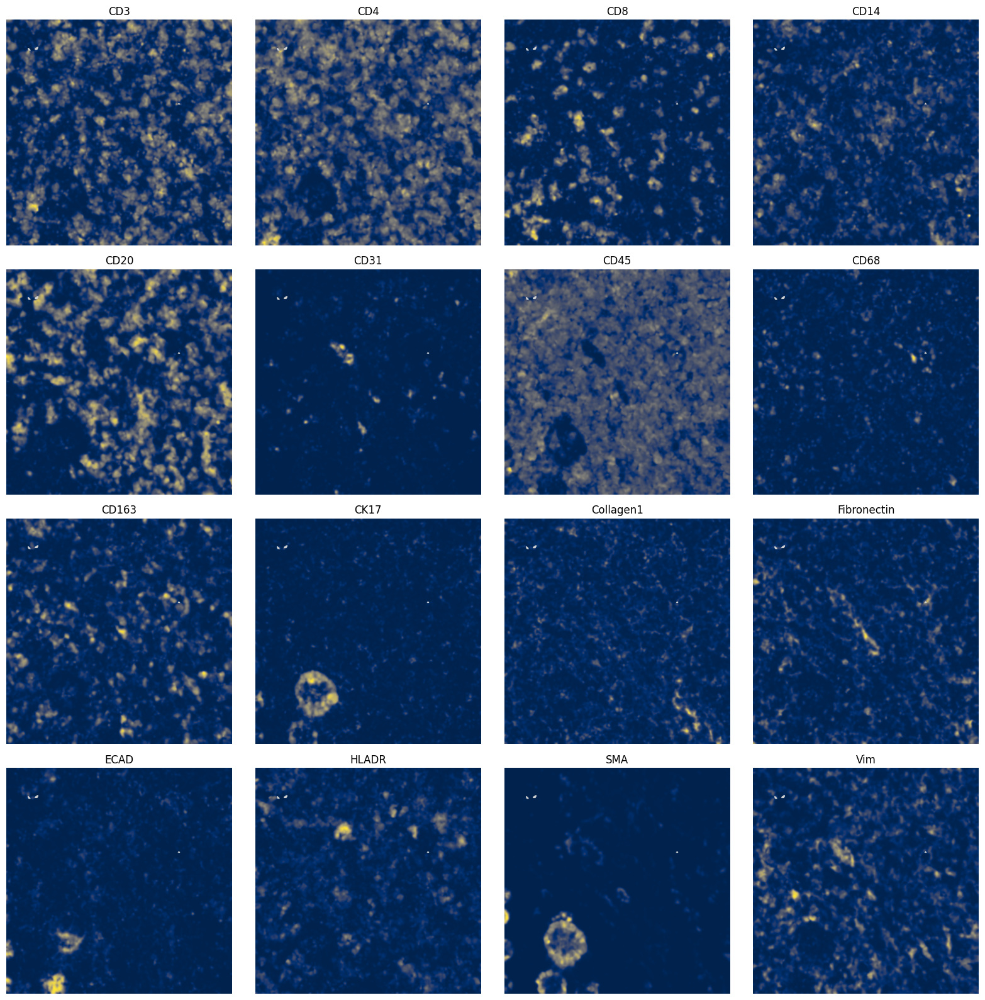

In [7]:
fig, axes = plt.subplots(4, 4, figsize=(16, 16))
_image_name = "raw_image_fov0_processed"
to_coordinate_system = "fov0"

for _ax, _channel in zip(axes.flatten(), channels, strict=True):
    render_images_kwargs = {"cmap": "cividis", "norm": None}
    show_kwargs = {"title": _channel, "colorbar": False}
    _ax = hp.pl.plot_sdata(
        sdata,
        image_name=_image_name,
        channel=_channel,
        to_coordinate_system=to_coordinate_system,
        render_images_kwargs=render_images_kwargs,
        show_kwargs=show_kwargs,
        ax=_ax,
    )
    # frameless figure
    _ax.axis("off")

plt.tight_layout()
plt.show()

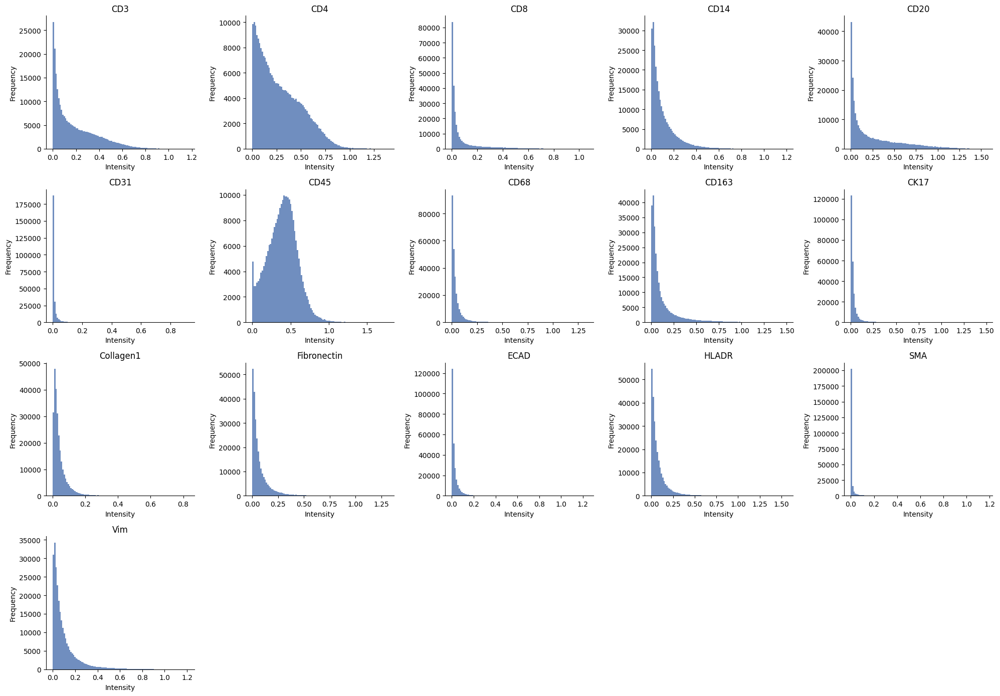

In [8]:
ax = hp.qc.image_histogram(
    sdata,
    image_name="raw_image_fov0_processed",
    channel=channels,
    ncols=5,
    bins=100,
)

## 3. Pixel clustering

In [9]:
import flowsom as fs
from dask.distributed import Client, LocalCluster

work_with_client = True

if work_with_client:
    # client example
    cluster = LocalCluster(
        n_workers=1,
        threads_per_worker=10,
    )

    client = Client(cluster)
    print(f"Dashboard link: {client.dashboard_link}")
else:
    client = None

batch_model = fs.models.BatchFlowSOMEstimator

sdata, fsom, mapping = hp.im.flowsom(
    sdata,
    image_name=[f"{_image_name}_processed" for _image_name in image_name],
    output_cluster_labels_name=[
        f"{_image_name}_flowsom_clusters" for _image_name in image_name
    ],  # we need output_cluster_layer and output_meta_cluster_layer --> these will both be labels elements
    output_metacluster_labels_name=[
        f"{_image_name}_flowsom_metaclusters" for _image_name in image_name
    ],
    n_clusters=20,
    random_state=111,
    chunks=512,
    client=client,
    model=batch_model,
    num_batches=10,
    xdim=10,
    ydim=10,
    z_score=True,
    z_cap=3,
    persist_intermediate=True,
    overwrite=True,
)

if client is not None:
    client.close()

/Users/arne.defauw/VIB/harpy_notebooks/.venv_harpy_cellpose_3/lib/python3.12/site-packages/distributed/node.py:188: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 52588 instead
  warnings.warn(
2026-03-23 11:43:28.512 | INFO     | harpy.image.pixel_clustering._clustering:flowsom:160 - Extracting random sample for FlowSOM training.


Dashboard link: http://127.0.0.1:52588/status


2026-03-23 11:43:29.414 | INFO     | harpy.image.pixel_clustering._clustering:_sample_dask_array:397 - Start sampling
2026-03-23 11:43:29.964 | INFO     | harpy.image.pixel_clustering._clustering:_sample_dask_array:397 - Start sampling
2026-03-23 11:43:30.494 | INFO     | harpy.image.pixel_clustering._clustering:_sample_dask_array:397 - Start sampling
2026-03-23 11:43:31.011 | INFO     | harpy.image.pixel_clustering._clustering:_sample_dask_array:397 - Start sampling
2026-03-23 11:43:31.553 | INFO     | harpy.image.pixel_clustering._clustering:_sample_dask_array:397 - Start sampling
2026-03-23 11:43:32.060 | INFO     | harpy.image.pixel_clustering._clustering:_sample_dask_array:397 - Start sampling
2026-03-23 11:43:32.551 | INFO     | harpy.image.pixel_clustering._clustering:_sample_dask_array:397 - Start sampling
2026-03-23 11:43:33.077 | INFO     | harpy.image.pixel_clustering._clustering:_sample_dask_array:397 - Start sampling
2026-03-23 11:43:33.602 | INFO     | harpy.image.pixel_c

In [10]:
sdata = hp.tb.cluster_intensity_SOM(
    sdata,
    mapping=mapping,
    image_name=[f"{_image_name}_processed" for _image_name in image_name],
    labels_name=[f"{_image_name}_flowsom_clusters" for _image_name in image_name],
    to_coordinate_system=[f"fov{i}" for i in range(N)],
    output_table_name="counts_clusters",
    overwrite=True,
)

2026-03-23 11:43:56.120 | INFO     | harpy.table.pixel_clustering._cluster_intensity:cluster_intensity_SOM:120 - Start allocation of intensities of image layer with name 'raw_image_fov0_processed' by labels in labels layer with name 'raw_image_fov0_flowsom_clusters'.
2026-03-23 11:43:56.666 | INFO     | harpy.table.pixel_clustering._cluster_intensity:cluster_intensity_SOM:139 - End allocation of image layer with name 'raw_image_fov0_processed' and labels layer with name 'raw_image_fov0_flowsom_clusters'.
2026-03-23 11:43:56.681 | INFO     | harpy.table.pixel_clustering._cluster_intensity:cluster_intensity_SOM:120 - Start allocation of intensities of image layer with name 'raw_image_fov1_processed' by labels in labels layer with name 'raw_image_fov1_flowsom_clusters'.
2026-03-23 11:43:57.478 | WARNING  | harpy.utils._io:_incremental_io_on_disk:78 - layer with name 'counts_clusters' already exists. Overwriting...
2026-03-23 11:43:58.074 | INFO     | harpy.table.pixel_clustering._cluster_

## 4. Visualization of pixel clusters and metaclusters

INFO     Dropping coordinate system 'fov9' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov10' since it doesn't have relevant elements.                               
INFO     Dropping coordinate system 'fov1' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov3' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov7' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov2' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov6' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov5' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov8' since it doesn't have relevan

(np.float64(0.0), np.float64(512.0), np.float64(512.0), np.float64(0.0))

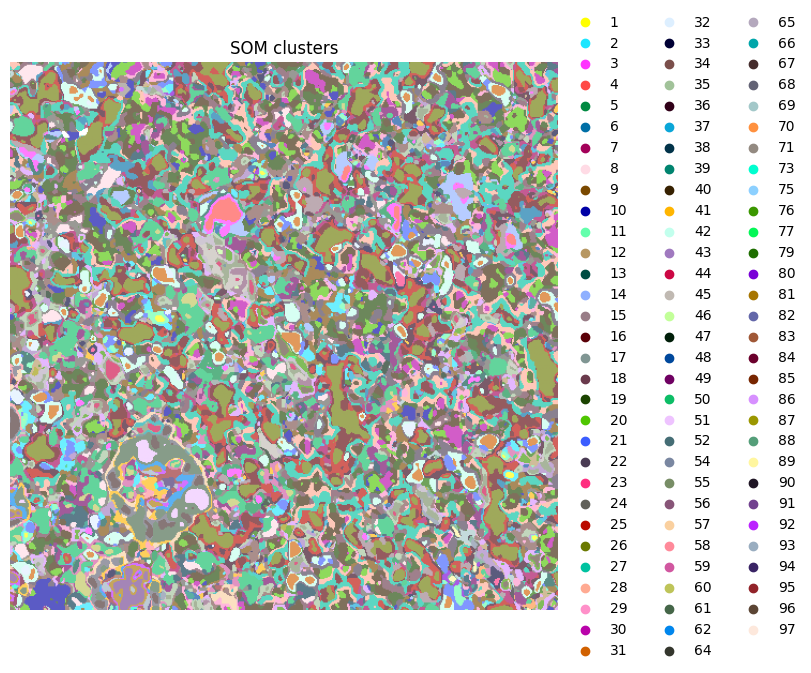

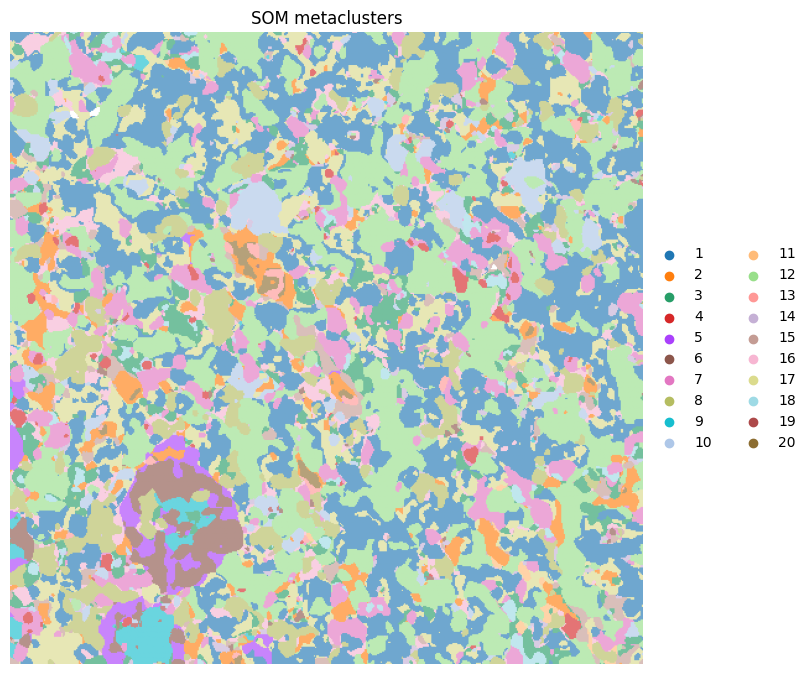

In [11]:
ax = hp.pl.pixel_clusters(
    sdata,
    labels_name="raw_image_fov0_flowsom_clusters",
    figsize=(8, 8),
    to_coordinate_system="fov0",
    render_labels_kwargs={"alpha": 1},
    title="SOM clusters",
)
ax.axis("off")

ax = hp.pl.pixel_clusters(
    sdata,
    labels_name="raw_image_fov0_flowsom_metaclusters",
    figsize=(8, 8),
    to_coordinate_system="fov0",
    render_labels_kwargs={"alpha": 1},
    title="SOM metaclusters",
)
ax.axis("off")

INFO     Dropping coordinate system 'fov9' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov10' since it doesn't have relevant elements.                               
INFO     Dropping coordinate system 'fov1' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov3' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov7' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov2' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov6' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov5' since it doesn't have relevant elements.                                
INFO     Dropping coordinate system 'fov8' since it doesn't have relevan

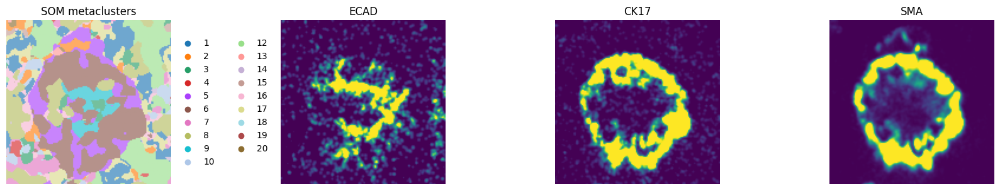

In [12]:
# visualize a crop:

fig, axes = plt.subplots(1, 4, figsize=(16, 4))

crd = [70, 210, 320, 460]

ax = hp.pl.pixel_clusters(
    sdata,
    labels_name="raw_image_fov0_flowsom_metaclusters",
    to_coordinate_system="fov0",
    ax=axes[0],
    render_labels_kwargs={"alpha": 1},
    crd=crd,
    title="SOM metaclusters",
)
ax.axis("off")

_image_name = "raw_image_fov0"
subset_channels = [
    "ECAD",
    "CK17",
    "SMA",
]

for _ax, _channel in zip(axes[1:], subset_channels, strict=True):
    # normalization parameters for visualization (underlying image not changed)
    se = hp.im.get_dataarray(sdata, element_name=_image_name)
    _channel_idx = np.where(sdata[_image_name].c.data == _channel)[0].item()
    vmax = da.percentile(se.data[_channel_idx].flatten(), q=99).compute()
    norm = Normalize(vmax=vmax, clip=False)

    render_images_kwargs = {"cmap": "viridis", "norm": norm}
    show_kwargs = {"title": _channel, "colorbar": False}
    _ax = hp.pl.plot_sdata(
        sdata,
        image_name=_image_name,
        to_coordinate_system="fov0",
        channel=_channel,
        crd=crd,
        render_images_kwargs=render_images_kwargs,
        show_kwargs=show_kwargs,
        ax=_ax,
    )
    # frameless figure
    _ax.axis("off")

plt.tight_layout()
plt.show()

## 5. Heatmap of channel intensity per cluster and metacluster

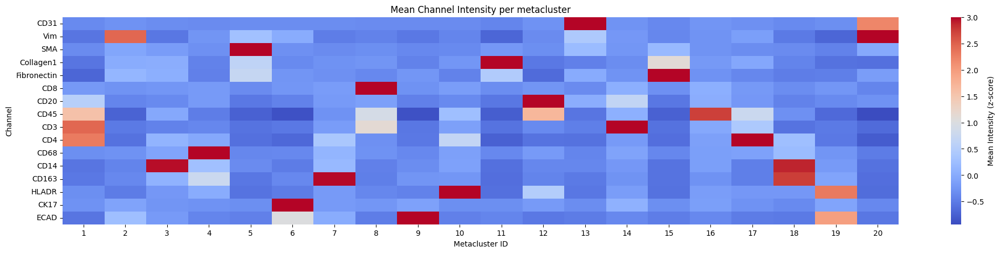

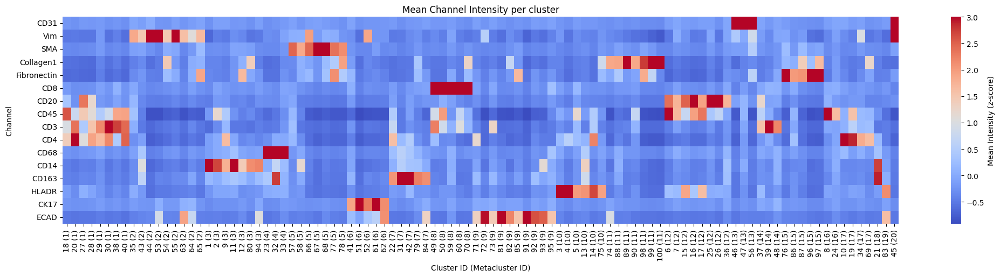

In [13]:
for _metaclusters in [True, False]:
    hp.pl.pixel_clusters_heatmap(
        sdata,
        table_name="counts_clusters",
        figsize=(25, 5),
        fig_kwargs={"dpi": 100},
        linewidths=0.001,
        metaclusters=_metaclusters,
        z_score=True,
    )

## 6. Spatial pixel neighbors

2026-03-23 11:44:17.207 | INFO     | harpy.image._manager:add_layer:47 - Writing results to layer 'labels_grid_aa79a15a-7628-4fc1-a9b0-fb4c047a001a'
no parent found for <ome_zarr.reader.Label object at 0x137305010>: None
no parent found for <ome_zarr.reader.Label object at 0x137959eb0>: None
no parent found for <ome_zarr.reader.Label object at 0x1395bacc0>: None
no parent found for <ome_zarr.reader.Label object at 0x1383ff7a0>: None
no parent found for <ome_zarr.reader.Label object at 0x1374d4cb0>: None
no parent found for <ome_zarr.reader.Label object at 0x136e180e0>: None
no parent found for <ome_zarr.reader.Label object at 0x136ef9e50>: None
no parent found for <ome_zarr.reader.Label object at 0x137e134a0>: None
no parent found for <ome_zarr.reader.Label object at 0x138434500>: None
no parent found for <ome_zarr.reader.Label object at 0x1374b7770>: None
no parent found for <ome_zarr.reader.Label object at 0x1383fe180>: None
no parent found for <ome_zarr.reader.Label object at 0x1370

INFO     Creating graph using `grid` coordinates and `None` transform and `1` libraries.                           


  0%|          | 0/1000 [00:00<?, ?/s]

/Users/arne.defauw/VIB/harpy_notebooks/.venv_harpy_cellpose_3/lib/python3.12/site-packages/squidpy/gr/_nhood.py:217: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)


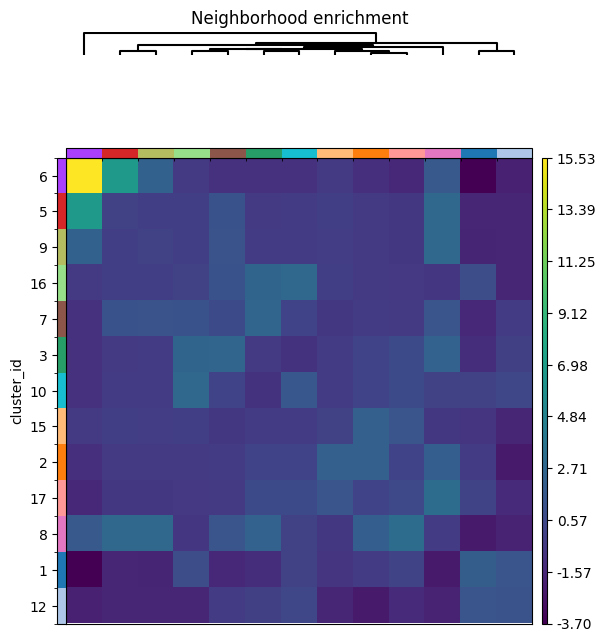

In [14]:
import numpy as np
import squidpy as sq

key_added = "cluster_id"

adata = hp.tb.spatial_pixel_neighbors(
    sdata,
    labels_name="raw_image_fov0_flowsom_metaclusters",
    key_added=key_added,
    mode="most_frequent",
    grid_type="hexagon",
    size=20,
    subset=None,
)

adata.uns[f"{key_added}_nhood_enrichment"]["zscore"] = np.nan_to_num(
    adata.uns[f"{key_added}_nhood_enrichment"]["zscore"]
)
sq.pl.nhood_enrichment(
    adata, cluster_key=key_added, method="ward", mode="zscore", figsize=(6, 6)
)

## 7. Cell clustering

In [15]:
batch_model = fs.models.BatchFlowSOMEstimator

table_name_flowsom_cell_clustering = "table_cell_clustering_flowsom"

sdata, fsom = hp.tb.flowsom(
    sdata,
    cells_labels_name=[
        f"label_whole_fov{i}" for i in range(N)
    ],  # segmentation masks, can be obtained using hp.im.segment.
    cluster_labels_name=[
        f"{_image_name}_flowsom_metaclusters" for _image_name in image_name
    ],  # here you could also choose  "raw_image_fov0_flowsom_clusters"
    output_table_name=table_name_flowsom_cell_clustering,
    chunks=512,
    model=batch_model,
    num_batches=10,
    random_state=100,
    overwrite=True,
)

2026-03-23 11:44:26.034 | INFO     | harpy.table.cell_clustering._preprocess:cell_clustering_preprocess:198 - Removing 2 cells with no overlap with any pixel cluster from table 'table_cell_clustering_flowsom'.
2026-03-23 11:44:26.035 | INFO     | harpy.table.cell_clustering._preprocess:cell_clustering_preprocess:210 - Removed 1 no-overlap cells for region 'label_whole_fov1' (instance ids: [305]).
2026-03-23 11:44:26.035 | INFO     | harpy.table.cell_clustering._preprocess:cell_clustering_preprocess:210 - Removed 1 no-overlap cells for region 'label_whole_fov3' (instance ids: [448]).
2026-03-23 11:44:26.596 | INFO     | harpy.table._preprocess:preprocess:318 - Calculating cell size from provided labels_layer 'label_whole_fov0'
2026-03-23 11:44:26.611 | INFO     | harpy.table._preprocess:preprocess:318 - Calculating cell size from provided labels_layer 'label_whole_fov1'
2026-03-23 11:44:26.645 | INFO     | harpy.table._preprocess:preprocess:318 - Calculating cell size from provided labe

Visualize the cell metaclusters:

INFO     Successfully extracted 17 colors from 'metaclustering_colors' in table 'table_cell_clustering_flowsom'.   
INFO     Successfully extracted 17 colors from 'metaclustering_colors' in table 'table_cell_clustering_flowsom'.   
INFO     Successfully extracted 17 colors from 'metaclustering_colors' in table 'table_cell_clustering_flowsom'.   


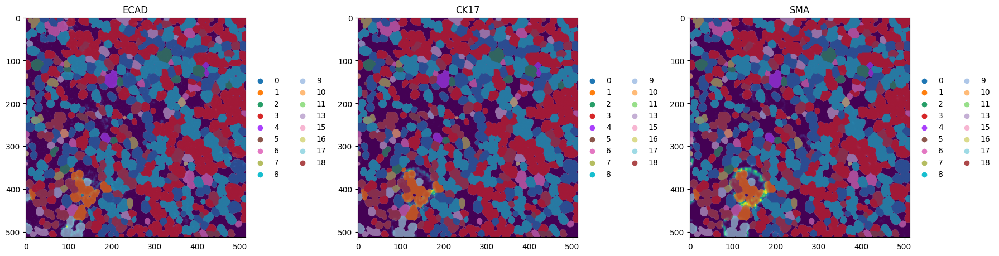

In [16]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
_image_name = "raw_image_fov0"
_labels_name = "label_whole_fov0"
subset_channels = ["ECAD", "CK17", "SMA"]

for _ax, _channel in zip(axes, subset_channels, strict=True):
    render_images_kwargs = {"cmap": "viridis", "norm": None}
    render_labels_kwargs = {"fill_alpha": 0.4, "outline_alpha": 0.4}
    show_kwargs = {"title": _channel, "colorbar": False}
    _ax = hp.pl.plot_sdata(
        sdata,
        image_name=_image_name,
        labels_name=_labels_name,
        table_name=table_name_flowsom_cell_clustering,
        color="metaclustering",
        channel=_channel,
        to_coordinate_system="fov0",
        render_images_kwargs=render_images_kwargs,
        render_labels_kwargs=render_labels_kwargs,
        show_kwargs=show_kwargs,
        ax=_ax,
    )
    # frameless figure
    # _ax.axis("off")

plt.tight_layout()
plt.show()

Now we want to visaulize the mean intensity per cell per cell metacluster, weighted by cell size. We first need to calculate the mean intensities per cell via `hp.tb.allocate_intensitiy`.

Note that in the ark pipeline, these intensities are weighted by the pixel SOM/META cluster count. To calculate these values, please use the `harpy` function `hp.tb.weighted_channel_expression`. Because for regular cell clustering, we only weight the intensities by the size of the cell, we choose to follow the same approach for Flowsom cell clustering.

In [17]:
labels_name = [f"label_whole_fov{i}" for i in range(N)]
to_coordinate_system = [f"fov{i}" for i in range(N)]
table_name = "table_intensities"

for i, (_image_name, _labels_name, _to_coordinate_system) in enumerate(
    zip(image_name, labels_name, to_coordinate_system, strict=True)
):
    sdata = hp.tb.allocate_intensity(
        sdata,
        image_name=_image_name,
        labels_name=_labels_name,
        channels=channels,
        output_table_name=table_name,
        mode="mean",
        to_coordinate_system=_to_coordinate_system,
        append=False if i == 0 else True,
        overwrite=True,
    )

2026-03-23 11:44:34.017 | WARNING  | harpy.utils._aggregate:_center_of_mass:879 - Count was computed for a different index. Recalculating.
/Users/arne.defauw/VIB/harpy_notebooks/.venv_harpy_cellpose_3/lib/python3.12/site-packages/harpy/table/_allocation_intensity.py:338: ImplicitModificationWarning: Setting element `.obsm['spatial']` of view, initializing view as actual.
  adata.obsm[spatial_key] = coordinates
2026-03-23 11:44:34.886 | WARNING  | harpy.utils._aggregate:_center_of_mass:879 - Count was computed for a different index. Recalculating.
/Users/arne.defauw/VIB/harpy_notebooks/.venv_harpy_cellpose_3/lib/python3.12/site-packages/harpy/table/_allocation_intensity.py:338: ImplicitModificationWarning: Setting element `.obsm['spatial']` of view, initializing view as actual.
  adata.obsm[spatial_key] = coordinates
2026-03-23 11:44:35.961 | WARNING  | harpy.utils._io:_incremental_io_on_disk:78 - layer with name 'table_intensities' already exists. Overwriting...
2026-03-23 11:44:36.978

The table element `table` contains annotated cluster information from the pixie pipeline (*Liu, C.C., Greenwald, N.F., Kong, A., et al. (2023)*), lets see how they compare to our predicted metaclusters.

We also compare the results with regular leiden clustering on the mean intensity values per cell.

In [18]:
import pandas as pd

from spatialdata.models import TableModel

instance_key = sdata[table_name].uns[TableModel.ATTRS_KEY][TableModel.INSTANCE_KEY]
region_key = sdata[table_name].uns[TableModel.ATTRS_KEY][TableModel.REGION_KEY_KEY]

df = (
    sdata["table"]
    .obs[["fov", "label", "cell_meta_cluster"]]
    .rename(
        columns={
            "fov": region_key,
            "label": instance_key,
            "cell_meta_cluster": "cell_type",
        }
    )
)

index = sdata[table_name].obs.index
sdata[table_name].obs = pd.merge(
    sdata[table_name].obs, df, how="inner", on=[instance_key, region_key]
)
sdata[table_name].obs.index = index

/Users/arne.defauw/.local/share/uv/python/cpython-3.12.12-macos-aarch64-none/lib/python3.12/functools.py:912: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)


Now also add the calculated (via `hp.tb.flowsom`) cell metacluster and cluster ids to the table element `'table_intensities'`.

In [19]:
columns = ["metaclustering", "clustering", instance_key, region_key]

index = sdata[table_name].obs.index
name = sdata[table_name].obs.index.name

sdata[table_name].obs = pd.merge(
    sdata[table_name].obs,
    sdata[table_name_flowsom_cell_clustering].obs[columns],
    on=[instance_key, region_key],
    how="left",  # left merge, because in table "table_cell_clustering_flowsom", we removed cells with no overlap with any pixel cluster
)
sdata[table_name].obs.index = index
sdata[table_name].obs.index.name = name

# back "table_intensities", now with metaclustering, clustering and cell_type in .obs to zarr
sdata = hp.tb.add_table(
    sdata,
    adata=sdata[table_name],
    output_table_name=table_name,
    region=[f"label_whole_fov{i}" for i in range(N)],
    overwrite=True,
)

/Users/arne.defauw/.local/share/uv/python/cpython-3.12.12-macos-aarch64-none/lib/python3.12/functools.py:912: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)
2026-03-23 11:44:57.028 | WARNING  | harpy.utils._io:_incremental_io_on_disk:78 - layer with name 'table_intensities' already exists. Overwriting...


2026-03-23 11:44:58.117 | INFO     | harpy.table._cluster_intensity:cluster_intensity:80 - Weighted (by instance size) average intensity per cluster (cluster key: 'metaclustering') will be stored in 'sdata[table_intensities].uns[metaclustering_weighted_intensity]'.
2026-03-23 11:44:58.125 | WARNING  | harpy.table._cluster_intensity:cluster_intensity:103 - Column with name 'shapeSize' not found in 'sdata[table_intensities].obs', calculating instance size for all instances in ['label_whole_fov0', 'label_whole_fov1', 'label_whole_fov2', 'label_whole_fov3', 'label_whole_fov4', 'label_whole_fov5', 'label_whole_fov6', 'label_whole_fov7', 'label_whole_fov8', 'label_whole_fov9', 'label_whole_fov10'].
2026-03-23 11:44:58.126 | INFO     | harpy.table._cluster_intensity:cluster_intensity:108 - Calculating instance size from provided labels layer 'label_whole_fov0'
2026-03-23 11:44:58.140 | INFO     | harpy.table._cluster_intensity:cluster_intensity:108 - Calculating instance size from provided la

Text(0.5, 25.722222222222214, 'cell metacluster')

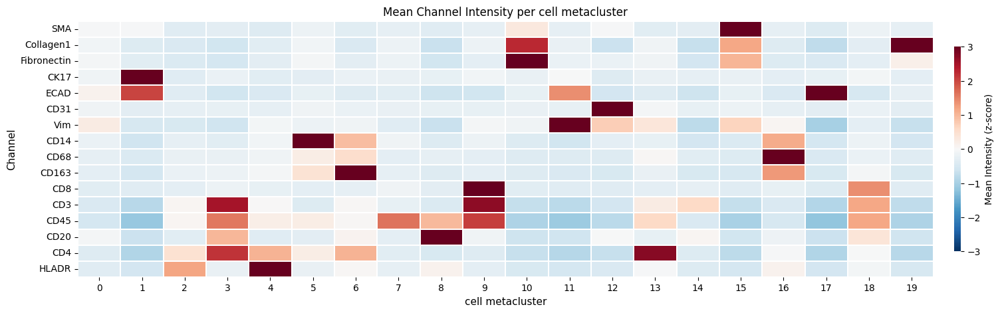

In [20]:
sdata = hp.tb.cluster_intensity(
    sdata,
    table_name=table_name,
    labels_name=[f"label_whole_fov{i}" for i in range(N)],
    output_table_name=table_name,
    cluster_key="metaclustering",
    overwrite=True,
)

ax = hp.pl.cluster_intensity_heatmap(
    sdata,
    table_name=table_name,
    cluster_key="metaclustering",
    figsize=(20, 5),
)
ax.set_title("Mean Channel Intensity per cell metacluster")
_x_label = "cell metacluster"

ax.set_ylabel("Channel")
ax.set_xlabel(_x_label)

Now compare these results with regular leiden clustering on the mean intensity values.

In [21]:
# normalize before calculating leiden clusters

labels_name = [f"label_whole_fov{i}" for i in range(N)]

sdata = hp.tb.preprocess_proteomics(
    sdata,
    labels_name=labels_name,
    table_name=table_name,
    output_table_name=f"{table_name}_normalized",
    size_norm=False,
    log1p=False,
    q=0.99,
    max_value_q=1,
    overwrite=True,
)

sdata[f"{table_name}_normalized"].to_df().head()

2026-03-23 11:45:01.582 | WARNING  | harpy.table._preprocess:preprocess:313 - Column with name 'shapeSize' already exists. Removing column 'shapeSize'.
2026-03-23 11:45:01.583 | INFO     | harpy.table._preprocess:preprocess:318 - Calculating cell size from provided labels_layer 'label_whole_fov0'
2026-03-23 11:45:01.599 | INFO     | harpy.table._preprocess:preprocess:318 - Calculating cell size from provided labels_layer 'label_whole_fov1'
2026-03-23 11:45:01.628 | INFO     | harpy.table._preprocess:preprocess:318 - Calculating cell size from provided labels_layer 'label_whole_fov2'
2026-03-23 11:45:01.663 | INFO     | harpy.table._preprocess:preprocess:318 - Calculating cell size from provided labels_layer 'label_whole_fov3'
2026-03-23 11:45:01.696 | INFO     | harpy.table._preprocess:preprocess:318 - Calculating cell size from provided labels_layer 'label_whole_fov4'
2026-03-23 11:45:01.728 | INFO     | harpy.table._preprocess:preprocess:318 - Calculating cell size from provided labe

channels,CD3,CD4,CD8,CD14,CD20,CD31,CD45,CD68,CD163,CK17,Collagen1,Fibronectin,ECAD,HLADR,SMA,Vim
cells,,,,,,,,,,,,,,,,
1_label_whole_fov0_09c64416,100.000000,96.655785,9.260165,6.321351,79.335533,0.000000,90.805908,6.274621,0.227555,1.503724,0.539386,1.673003,5.863480,6.114070,0.000000,8.542078
2_label_whole_fov0_09c64416,100.000000,100.000000,1.209254,100.000000,2.598548,1.285120,100.000000,12.967047,16.018177,8.001880,6.170453,0.884670,1.455017,43.258686,0.000000,3.866230
3_label_whole_fov0_09c64416,15.790016,85.442596,1.418018,12.311816,2.535572,1.271602,21.691730,0.000000,6.402584,2.490408,4.536551,6.552049,19.387783,67.727722,1.097208,9.684464
4_label_whole_fov0_09c64416,3.287402,28.842407,1.678827,4.460878,2.108853,0.098956,17.441771,53.642143,7.235740,15.314676,8.828622,6.231126,2.147254,7.351690,1.177836,3.420511
5_label_whole_fov0_09c64416,94.864815,100.000000,1.495612,16.172941,11.171283,2.316715,100.000000,13.128244,10.937386,18.826359,29.220844,22.919373,17.487209,43.814114,7.093751,15.714072


In [22]:
sdata = hp.tb.leiden(
    sdata,
    labels_name=labels_name,
    table_name=f"{table_name}_normalized",
    output_table_name=f"{table_name}_normalized",
    key_added="leiden",
    overwrite=True,
)

2026-03-23 11:46:11.377 | WARNING  | harpy.utils._io:_incremental_io_on_disk:78 - layer with name 'table_intensities_normalized' already exists. Overwriting...


INFO     Successfully extracted 11 colors from 'leiden_colors' in table 'table_intensities_normalized'.            
INFO     Successfully extracted 11 colors from 'leiden_colors' in table 'table_intensities_normalized'.            
INFO     Successfully extracted 11 colors from 'leiden_colors' in table 'table_intensities_normalized'.            


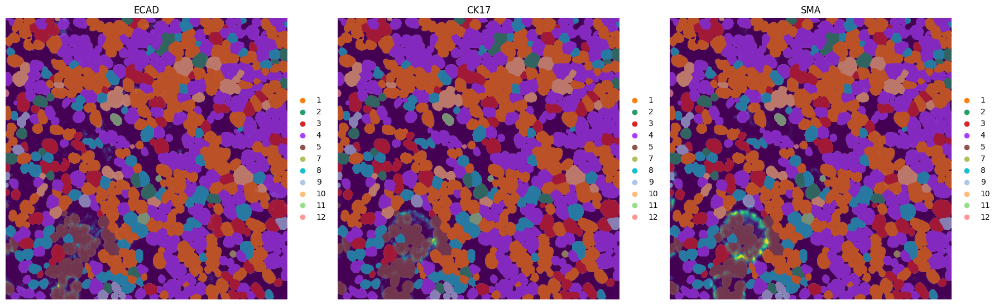

In [23]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
_image_name = "raw_image_fov0"
subset_channels = ["ECAD", "CK17", "SMA"]

for _ax, _channel in zip(axes, subset_channels, strict=True):
    render_images_kwargs = {"cmap": "viridis", "norm": None}
    render_labels_kwargs = {"fill_alpha": 0.4, "outline_alpha": 0.4}
    show_kwargs = {"title": _channel, "colorbar": False}
    _ax = hp.pl.plot_sdata(
        sdata,
        image_name=_image_name,
        labels_name="label_whole_fov0",
        table_name=f"{table_name}_normalized",
        color="leiden",
        channel=_channel,
        to_coordinate_system="fov0",
        render_images_kwargs=render_images_kwargs,
        render_labels_kwargs=render_labels_kwargs,
        show_kwargs=show_kwargs,
        ax=_ax,
    )
    # frameless figure
    _ax.axis("off")

plt.tight_layout()
plt.show()

2026-03-23 11:46:15.257 | INFO     | harpy.table._cluster_intensity:cluster_intensity:80 - Weighted (by instance size) average intensity per cluster (cluster key: 'leiden') will be stored in 'sdata[table_intensities_normalized].uns[leiden_weighted_intensity]'.
2026-03-23 11:46:18.314 | WARNING  | harpy.utils._io:_incremental_io_on_disk:78 - layer with name 'table_intensities_normalized' already exists. Overwriting...
2026-03-23 11:46:21.490 | INFO     | harpy.table._manager:_cast_colors_sdata:110 - Casting key leiden_colors to '<U7'.


<Axes: title={'center': 'Mean Channel Intensity per leiden cluster'}, xlabel='leiden cluster', ylabel='Channel'>

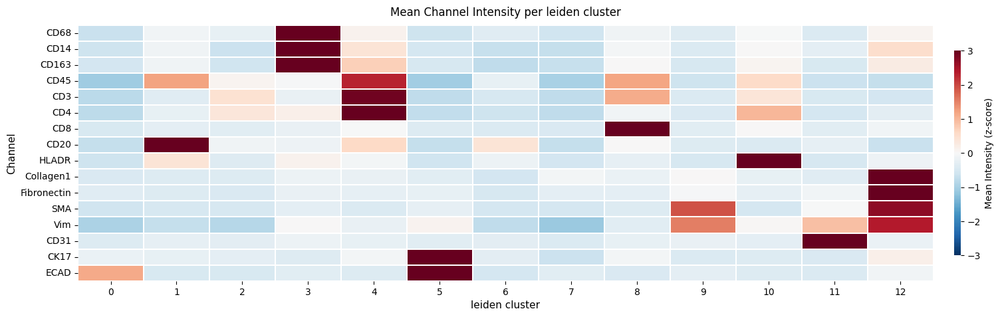

In [24]:
sdata = hp.tb.cluster_intensity(
    sdata,
    table_name=f"{table_name}_normalized",
    labels_name=labels_name,
    output_table_name=f"{table_name}_normalized",
    cluster_key="leiden",
    layer_mean_intensities="raw_counts",  # layer in adata.layers that holds the mean intensities
    overwrite=True,
)
hp.pl.cluster_intensity_heatmap(
    sdata,
    table_name=f"{table_name}_normalized",
    cluster_key="leiden",
    figsize=(20, 5),
)

INFO     Successfully extracted 17 colors from 'metaclustering_colors' in table 'table_intensities_normalized'.    
INFO     Successfully extracted 11 colors from 'leiden_colors' in table 'table_intensities_normalized'.            
INFO     Successfully extracted 14 colors from 'cell_type_colors' in table 'table_intensities_normalized'.         


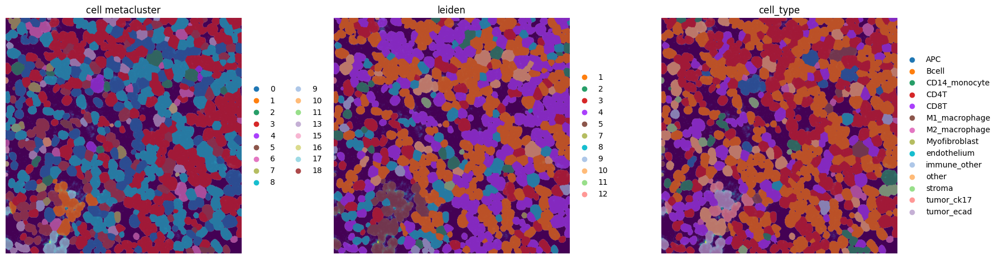

In [25]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
_image_name = "raw_image_fov0"
_labels_name = "label_whole_fov0"
_to_coordinate_system = "fov0"
channel = "ECAD"

colors = ["metaclustering", "leiden", "cell_type"]

for _ax, _color in zip(axes, colors, strict=True):
    render_images_kwargs = {"cmap": "viridis", "norm": None}
    render_labels_kwargs = {"fill_alpha": 0.4, "outline_alpha": 0.4}
    show_kwargs = {
        "title": "cell metacluster" if _color == "metaclustering" else _color,
        "colorbar": False,
    }
    _ax = hp.pl.plot_sdata(
        sdata,
        image_name=_image_name,
        labels_name=_labels_name,
        table_name=f"{table_name}_normalized",
        color=_color,
        channel=channel,
        to_coordinate_system=_to_coordinate_system,
        render_images_kwargs=render_images_kwargs,
        render_labels_kwargs=render_labels_kwargs,
        show_kwargs=show_kwargs,
        ax=_ax,
    )
    # frameless figure
    _ax.axis("off")

plt.tight_layout()
plt.show()

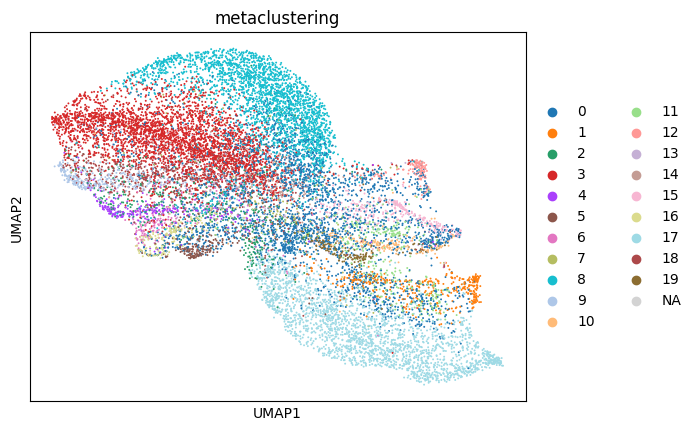

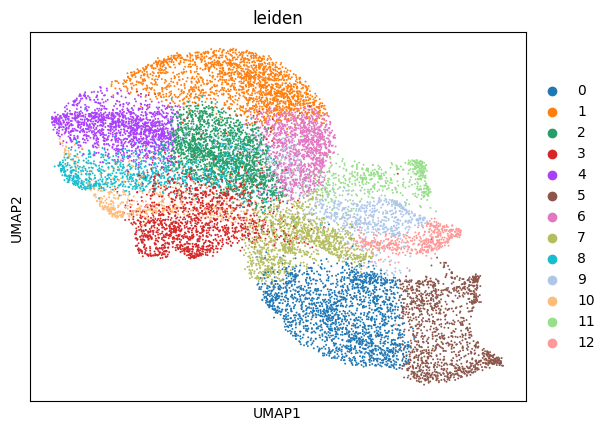

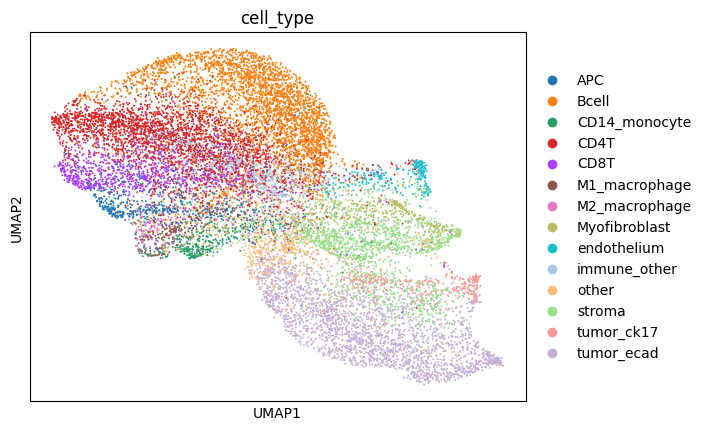

In [26]:
import scanpy as sc

# note that these umaps are skwed towards the flowsom metaclusters, because cell type was annotated in Liu, C.C., Greenwald, N.F., Kong, A., et al. (2023) based on the flowsom cell metaclusters.
sc.pl.umap(sdata[f"{table_name}_normalized"], color=["metaclustering"])
sc.pl.umap(sdata[f"{table_name}_normalized"], color=["leiden"])
sc.pl.umap(sdata[f"{table_name}_normalized"], color=["cell_type"])

Cramers v: 0.69991741063673
Chi-squared statistic: 97654.5324193182
p-value: 0.0


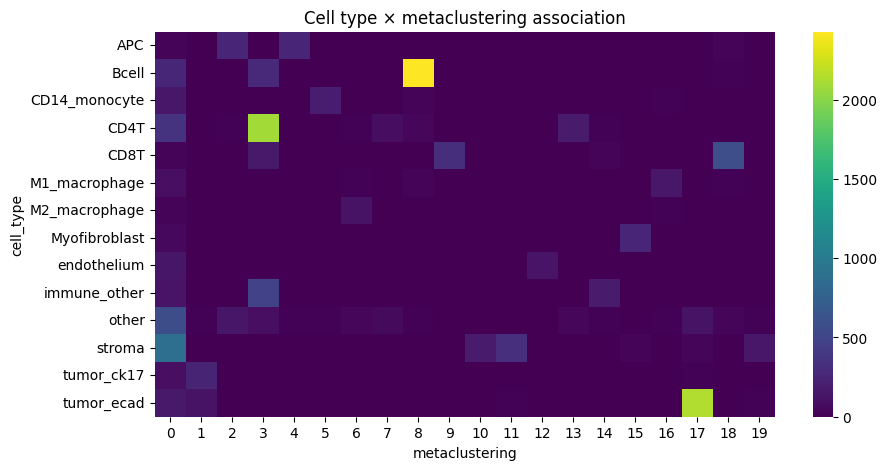

         cell_type metaclustering  std_residual   abs_resid
155  Myofibroblast             15    103.856744  103.856744
277     tumor_ecad             17     91.604831   91.604831
28           Bcell              8     87.202481   87.202481
4              APC              4     77.543951   77.543951
241     tumor_ck17              1     77.285909   77.285909
45   CD14_monocyte              5     77.060010   77.060010
172    endothelium             12     76.526940   76.526940
98            CD8T             18     75.466500   75.466500
126  M2_macrophage              6     73.204699   73.204699
116  M1_macrophage             16     72.479940   72.479940
63            CD4T              3     64.018750   64.018750
89            CD8T              9     61.189459   61.189459
2              APC              2     59.505149   59.505149
231         stroma             11     48.206569   48.206569
194   immune_other             14     46.467947   46.467947
230         stroma             10     35

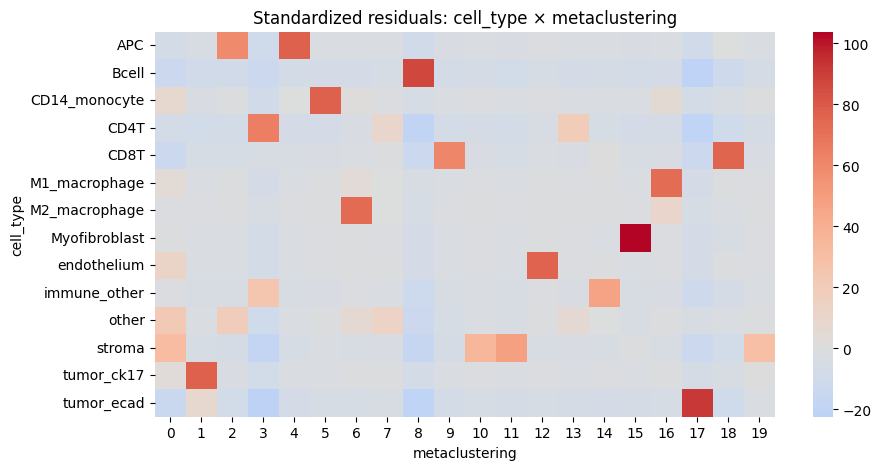

Cramers v: 0.5964185759950482
Chi-squared statistic: 65462.96455749018
p-value: 0.0


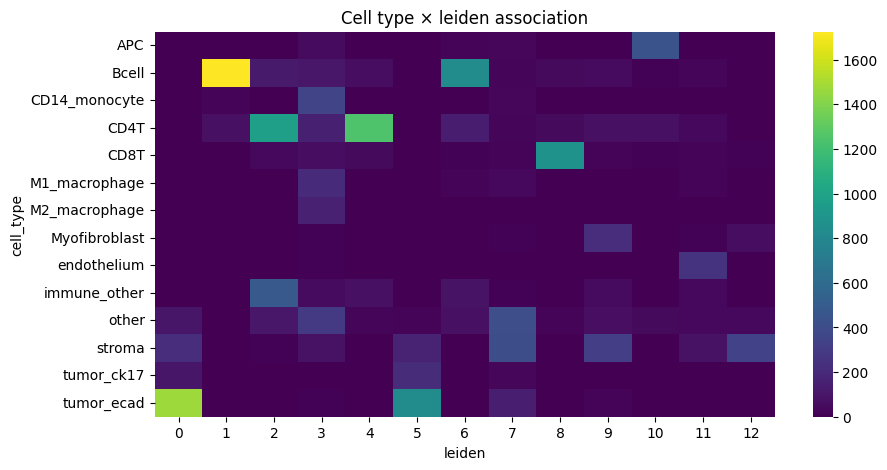

         cell_type leiden  std_residual  abs_resid
60            CD8T      8     95.244502  95.244502
10             APC     10     91.814672  91.814672
115    endothelium     11     78.908615  78.908615
14           Bcell      1     72.854824  72.854824
169     tumor_ecad      0     66.835918  66.835918
43            CD4T      4     60.049037  60.049037
100  Myofibroblast      9     49.568946  49.568946
29   CD14_monocyte      3     48.177373  48.177373
174     tumor_ecad      5     44.836489  44.836489
155         stroma     12     42.461703  42.461703
119   immune_other      2     41.272904  41.272904
19           Bcell      6     39.881712  39.881712
41            CD4T      2     36.845028  36.845028
81   M2_macrophage      3     34.920952  34.920952
161     tumor_ck17      5     34.536849  34.536849
137          other      7     33.313912  33.313912
68   M1_macrophage      3     33.243298  33.243298
150         stroma      7     25.112493  25.112493
152         stroma      9     2

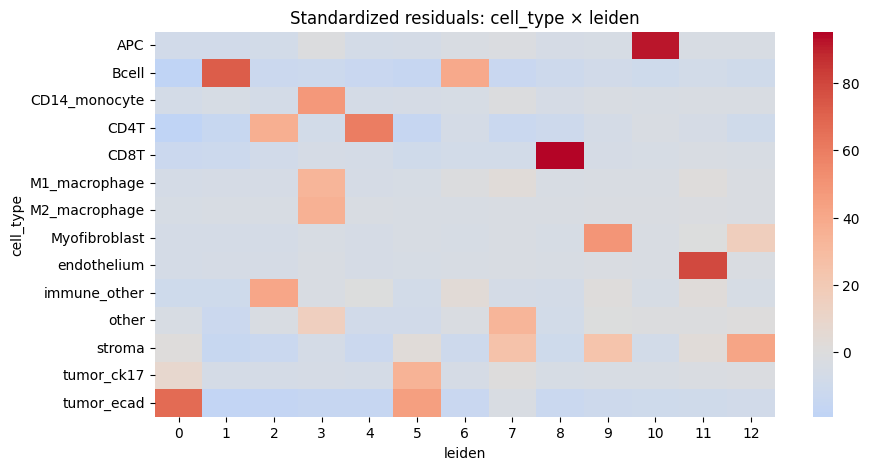

In [27]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import chi2_contingency

table_name = "table_intensities_normalized"

for _cluster_key in ["metaclustering", "leiden"]:
    df = sdata[table_name].obs.copy()

    df = df[~df["cell_type"].isna()]

    contingency = pd.crosstab(df["cell_type"], df[_cluster_key])

    # chi squared test
    chi2, p, dof, expected = chi2_contingency(contingency)

    # cramers v
    def _cramers_v(confusion_matrix):
        chi2 = chi2_contingency(confusion_matrix)[0]
        n = confusion_matrix.sum().sum()
        phi2 = chi2 / n
        r, k = confusion_matrix.shape
        return np.sqrt(phi2 / min(k - 1, r - 1))

    print("Cramers v:", _cramers_v(contingency))

    print("Chi-squared statistic:", chi2)
    print("p-value:", p)

    plt.figure(figsize=(10, 5))
    sns.heatmap(contingency, cmap="viridis")
    plt.title(f"Cell type × {_cluster_key} association")
    plt.show()

    # Calculate standardized residuals
    residuals = (contingency - expected) / np.sqrt(expected)

    residuals_df = pd.DataFrame(
        residuals, index=contingency.index, columns=contingency.columns
    )

    resid_long = residuals_df.stack().reset_index()
    resid_long.columns = ["cell_type", _cluster_key, "std_residual"]

    # Sort by strength of deviation
    resid_long["abs_resid"] = resid_long["std_residual"].abs()
    top_effects = resid_long.sort_values("abs_resid", ascending=False).head(20)
    print(top_effects)

    plt.figure(figsize=(10, 5))
    sns.heatmap(residuals_df, center=0, cmap="coolwarm", annot=False)
    plt.title(f"Standardized residuals: cell_type × {_cluster_key}")
    plt.show()

We notice a higher correlation between cell type predicted via cell metaclustering, compared to regular leiden clustering.

In [28]:
# "table_cell_clustering_flowsom" is annotated by segmentation masks, so they can also be visualised using napari-spatialdata
from spatialdata.models import TableModel

sdata["table_cell_clustering_flowsom"].uns[TableModel.ATTRS_KEY]

# from napari_spatialdata import Interactive

# Interactive(sdata)

{'region': ['label_whole_fov0',
  'label_whole_fov1',
  'label_whole_fov2',
  'label_whole_fov3',
  'label_whole_fov4',
  'label_whole_fov5',
  'label_whole_fov6',
  'label_whole_fov7',
  'label_whole_fov8',
  'label_whole_fov9',
  'label_whole_fov10'],
 'instance_key': 'cell_ID',
 'region_key': 'fov_labels'}

## Optional export to a .csv format that can be used for visualization using the ark analysis [gui](https://github.com/angelolab/ark-analysis/blob/main/templates/2_Pixie_Cluster_Pixels.ipynb)

In [29]:
# weighted channel average for visualization in the ark analysis gui (optional) -> calculate this on the flowsom clustered matrix
sdata = hp.tb.weighted_channel_expression(
    sdata,
    cell_clustering_table_name="table_cell_clustering_flowsom",
    table_name_pixel_cluster_intensity="counts_clusters",
    output_table_name="table_cell_clustering_flowsom",
    clustering_key=ClusteringKey._METACLUSTERING_KEY,
    overwrite=True,
)

2026-03-23 11:46:23.457 | INFO     | harpy.table.cell_clustering._weighted_channel_expression:weighted_channel_expression:129 - Adding mean over obtained cell clusters '(clustering)' of the average marker expression for each cell weighted by pixel cluster count to '.uns[ 'clustering_channels' ]' of table layer 'table_cell_clustering_flowsom'
2026-03-23 11:46:23.462 | INFO     | harpy.table.cell_clustering._weighted_channel_expression:weighted_channel_expression:129 - Adding mean over obtained cell clusters '(metaclustering)' of the average marker expression for each cell weighted by pixel cluster count to '.uns[ 'metaclustering_channels' ]' of table layer 'table_cell_clustering_flowsom'
2026-03-23 11:46:23.462 | INFO     | harpy.table.cell_clustering._weighted_channel_expression:weighted_channel_expression:134 - Adding average marker expression for each cell weighted by pixel cluster count to '.obs' of table layer 'table_cell_clustering_flowsom'
2026-03-23 11:46:27.318 | WARNING  | har

In [30]:
from harpy.table.cell_clustering._utils import (
    _export_to_ark_format as _export_to_ark_format_cells,
)
from harpy.table.pixel_clustering._cluster_intensity import (
    _export_to_ark_format as _export_to_ark_format_pixels,
)

df = _export_to_ark_format_pixels(adata=sdata["counts_clusters"], output=None)
(
    df_cell_som_cluster_count_avg,
    df_cell_som_cluster_channel_avg,
    df_cell_meta_cluster_channel_avg,
) = _export_to_ark_format_cells(
    sdata, table_name="table_cell_clustering_flowsom", output=None
)
df.head()

2026-03-23 11:46:31.391 | WARNING  | harpy.table.cell_clustering._utils:_export_to_ark_format:33 - Increasing cell cluster IDs (SOM cluster and meta cluster IDs) with +1 for visualization. The underlying dataframe in the SpatialData object remains unchanges.
2026-03-23 11:46:31.395 | WARNING  | harpy.table.cell_clustering._utils:_export_to_ark_format:52 - Increasing cell cluster IDs (SOM cluster and meta cluster IDs) with +1 for visualization. The underlying dataframe in the SpatialData object remains unchanges.
2026-03-23 11:46:31.399 | WARNING  | harpy.table.cell_clustering._utils:_export_to_ark_format:52 - Increasing cell cluster IDs (SOM cluster and meta cluster IDs) with +1 for visualization. The underlying dataframe in the SpatialData object remains unchanges.


channels,CD3,CD4,CD8,CD14,CD20,CD31,CD45,CD68,CD163,CK17,Collagen1,Fibronectin,ECAD,HLADR,SMA,Vim,pixel_meta_cluster,pixel_som_cluster,count
SOM_cluster_ID_index,,,,,,,,,,,,,,,,,,,
1_counts_clusters_4a0295d3,3.170556,12.888708,2.673701,102.297302,1.981421,1.010174,15.915800,5.115088,13.101303,1.311709,7.427465,6.707138,3.581628,7.404450,2.121363,3.902526,3,1,61858.0
2_counts_clusters_4a0295d3,7.802601,15.197968,5.868374,52.094273,6.514609,2.945678,43.575554,6.603859,11.311961,2.333262,7.480127,5.921785,3.862716,10.003304,2.255558,7.188983,3,2,76777.0
3_counts_clusters_4a0295d3,8.591969,18.529282,5.463168,7.904346,4.000842,1.638508,19.988863,6.152431,7.790992,2.215147,7.164235,5.330628,4.973933,78.794853,1.134772,11.190743,10,3,101431.0
4_counts_clusters_4a0295d3,6.426503,24.199673,3.257826,4.316765,1.848322,0.914533,15.558946,3.096722,4.072947,1.105101,4.323403,2.858347,2.538521,117.102592,0.420902,5.771106,10,4,59752.0
5_counts_clusters_4a0295d3,16.677263,19.242825,9.086171,8.071563,7.421441,2.405537,43.708309,5.483037,7.129220,3.141083,6.394245,4.868136,4.656443,43.941631,1.605118,9.540346,10,5,85247.0


In [31]:
df_cell_meta_cluster_channel_avg.head()

,cell_meta_cluster,CD3,CD4,CD8,CD14,CD20,CD31,CD45,CD68,CD163,CK17,Collagen1,Fibronectin,ECAD,HLADR,SMA,Vim,cell_meta_cluster_rename
0,1,13.312110,14.540046,5.212882,10.652877,9.342804,4.176129,19.527418,5.825487,8.925391,4.812573,13.868835,12.002700,10.981284,8.484389,5.987512,19.682054,1
1,2,6.822442,6.668731,4.851417,7.685502,3.745090,2.177237,6.608780,3.866220,8.094399,32.722800,11.086600,10.109598,32.357767,5.390016,3.112652,15.338476,2
2,3,15.606988,23.245666,5.825461,10.316361,6.800073,2.170474,24.766719,6.335626,9.973863,3.105719,10.342049,7.480709,9.202182,33.578242,2.408904,10.282013,3
3,4,40.002591,39.067493,6.690993,6.638652,13.699744,2.078078,41.266476,4.937002,7.077583,3.187016,6.369957,4.418863,3.123610,8.655178,2.144527,8.340994,4
4,5,12.083061,23.661401,5.614998,11.034528,4.662411,1.841157,24.230448,6.375871,9.522896,2.408798,10.240973,7.033974,4.482985,54.909245,1.879081,9.668706,5
